In [7]:
import numpy as np
import pandas as pd

In [8]:
from google.colab import files
upload = files.upload()

Saving Bankruptcy_data_Final.xlsx to Bankruptcy_data_Final.xlsx


In [74]:
df = pd.read_excel("Bankruptcy_data_Final.xlsx")

In [75]:
df.head()

,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
0,1.58,0.36,0.18,0.13,1.33,1.77,0.07,0.15,2.22,NaN,NaN,NaN,0
1,1.41,0.36,0.19,0.12,1.31,1.59,0.07,0.13,2.41,0.126319,0.014278,0.040179,0
2,0.31,0.32,0.13,0.08,1.03,1.55,0.05,0.04,2.56,0.368077,0.327909,0.566524,0
3,0.71,0.28,0.14,0.08,0.80,1.39,0.06,0.05,5.28,-0.020809,-0.118904,-0.095890,0
4,0.75,0.41,0.13,0.08,0.20,1.30,0.06,0.04,8.68,0.233089,0.146807,0.053030,0


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92872 entries, 0 to 92871
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   EPS                 92867 non-null  float64
 1   Liquidity           92625 non-null  float64
 2   Profitability       92625 non-null  float64
 3   Productivity        92625 non-null  float64
 4   Leverage Ratio      92846 non-null  float64
 5   Asset Turnover      92625 non-null  float64
 6   Operational Margin  87315 non-null  float64
 7   Return on Equity    92864 non-null  float64
 8   Market Book Ratio   92815 non-null  float64
 9   Assets Growth       86171 non-null  float64
 10  Sales Growth        86171 non-null  float64
 11  Employee Growth     85862 non-null  float64
 12  BK                  92872 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 9.2 MB


In [78]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [42]:
df.isnull().sum()

EPS                      5
Liquidity              247
Profitability          247
Productivity           247
Leverage Ratio          26
Asset Turnover         247
Operational Margin    5557
Return on Equity         8
Market Book Ratio       57
Assets Growth         6701
Sales Growth          6701
Employee Growth       7010
BK                       0
dtype: int64

In [43]:
def fill_missing(col):
  df[col] = df[col].fillna(df[col].mode()[0]) 


In [46]:
fill_missing("EPS")
fill_missing("Liquidity")
fill_missing("Profitability")
fill_missing("Productivity")
fill_missing("Leverage Ratio")
fill_missing("Asset Turnover")
fill_missing("Operational Margin")
fill_missing("Return on Equity")
fill_missing("Market Book Ratio")
fill_missing("Assets Growth")
fill_missing("Sales Growth")
fill_missing("Employee Growth")


In [47]:
df.isnull().sum()

EPS                   0
Liquidity             0
Profitability         0
Productivity          0
Leverage Ratio        0
Asset Turnover        0
Operational Margin    0
Return on Equity      0
Market Book Ratio     0
Assets Growth         0
Sales Growth          0
Employee Growth       0
BK                    0
dtype: int64

In [48]:
from sklearn.model_selection import train_test_split

In [49]:
X = df.drop(['BK'],axis=1)

In [50]:
y = df['BK']

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.3)

In [53]:
df

,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
0,1.580000,0.360000,0.180000,0.130000,1.330000,1.770000,0.070000,0.150000,2.220000,0.000000,0.000000,0.000000,0
1,1.410000,0.360000,0.190000,0.120000,1.310000,1.590000,0.070000,0.130000,2.410000,0.126319,0.014278,0.040179,0
2,0.310000,0.320000,0.130000,0.080000,1.030000,1.550000,0.050000,0.040000,2.560000,0.368077,0.327909,0.566524,0
3,0.710000,0.280000,0.140000,0.080000,0.800000,1.390000,0.060000,0.050000,5.280000,-0.020809,-0.118904,-0.095890,0
4,0.750000,0.410000,0.130000,0.080000,0.200000,1.300000,0.060000,0.040000,8.680000,0.233089,0.146807,0.053030,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
92867,-1.488171,-0.015494,-0.758859,-0.056905,-1042.104918,0.174115,-0.326823,-6.614095,-1.846719,-0.073287,-0.557483,-0.076923,0
92868,-1.807630,0.093838,-1.204734,-0.121122,-4.530214,0.215844,-0.561155,-4.519074,-2.474549,-0.201835,-0.010544,-0.208333,0
92869,-0.015660,0.039260,0.000000,-0.082429,0.744907,0.254186,-0.324286,-0.569448,3274.505633,-0.168001,-0.020206,-0.105263,0
92870,-0.133054,0.053678,-0.029471,0.000998,0.574570,0.195683,0.005101,-0.085842,36.474842,0.076936,-0.170928,-0.058824,0


In [54]:
from pycaret.classification import *

In [55]:
clf = setup(df, target = "BK", session_id=123, log_experiment=True, experiment_name='bankruptcy')

,Description,Value
0,session_id,123
1,Target,BK
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(92872, 13)"
5,Missing Values,False
6,Numeric Features,12
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [56]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9938,0.0000,0.0000,0.0000,0.0000,-0.0000,-0.0001,0.065
rf,Random Forest Classifier,0.9938,0.8905,0.0124,0.4000,0.0239,0.0236,0.0688,10.683
et,Extra Trees Classifier,0.9938,0.8718,0.0073,0.3000,0.0143,0.0142,0.0467,6.179
lr,Logistic Regression,0.9937,0.4012,0.0000,0.0000,0.0000,-0.0002,-0.0006,7.603
knn,K Neighbors Classifier,0.9935,0.6294,0.0123,0.2033,0.0231,0.0223,0.0480,2.441
ada,Ada Boost Classifier,0.9935,0.9039,0.0074,0.1200,0.0138,0.0131,0.0279,3.494
lda,Linear Discriminant Analysis,0.9935,0.6229,0.0000,0.0000,0.0000,-0.0005,-0.0011,0.159
gbc,Gradient Boosting Classifier,0.9930,0.9110,0.0669,0.2691,0.1054,0.1032,0.1298,15.727
lightgbm,Light Gradient Boosting Machine,0.9927,0.9222,0.1042,0.2739,0.1496,0.1467,0.1649,0.887
dt,Decision Tree Classifier,0.9884,0.5575,0.1212,0.1094,0.1145,0.1088,0.1091,0.715


In [57]:
from sklearn.ensemble import RandomForestClassifier

In [58]:
clf_rf = RandomForestClassifier()
clf_rf.fit(X_train,y_train)
y_pred = clf_rf.predict(X_test)

In [65]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00     27708
           1       1.00      0.01      0.01       154

    accuracy                           0.99     27862
   macro avg       1.00      0.50      0.51     27862
weighted avg       0.99      0.99      0.99     27862



In [60]:
from sklearn.metrics import confusion_matrix

In [62]:
confusion_matrix(y_test,y_pred)

array([[27708,     0],
       [  153,     1]])

In [66]:
from sklearn.tree import DecisionTreeClassifier

In [68]:
clf_dt = DecisionTreeClassifier()
clf_dt.fit(X_train,y_train)
y_pred_dt = clf_dt.predict(X_test)

In [70]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99     27708
           1       0.06      0.08      0.07       154

    accuracy                           0.99     27862
   macro avg       0.53      0.54      0.53     27862
weighted avg       0.99      0.99      0.99     27862



In [71]:
confusion_matrix(y_test, y_pred_dt)

array([[27512,   196],
       [  141,    13]])

[Text(135.73512943914685, 213.0912, 'X[7] <= -1.244\ngini = 0.012\nsamples = 65010\nvalue = [64606, 404]'),
 Text(44.772800679983, 204.3936, 'X[5] <= 0.593\ngini = 0.122\nsamples = 2635\nvalue = [2463, 172]'),
 Text(19.060454738631535, 195.696, 'X[4] <= -24.191\ngini = 0.062\nsamples = 1288\nvalue = [1247, 41]'),
 Text(14.157501062473438, 186.9984, 'X[7] <= -2.275\ngini = 0.355\nsamples = 13\nvalue = [10, 3]'),
 Text(13.39864003399915, 178.3008, 'X[0] <= -1.959\ngini = 0.48\nsamples = 5\nvalue = [2, 3]'),
 Text(12.639779005524861, 169.60320000000002, 'gini = 0.0\nsamples = 3\nvalue = [0, 3]'),
 Text(14.157501062473438, 169.60320000000002, 'gini = 0.0\nsamples = 2\nvalue = [2, 0]'),
 Text(14.916362090947727, 178.3008, 'gini = 0.0\nsamples = 8\nvalue = [8, 0]'),
 Text(23.96340841478963, 186.9984, 'X[0] <= -0.224\ngini = 0.058\nsamples = 1275\nvalue = [1237, 38]'),
 Text(16.434084147896304, 178.3008, 'X[0] <= -0.229\ngini = 0.079\nsamples = 895\nvalue = [858, 37]'),
 Text(15.6752231194220

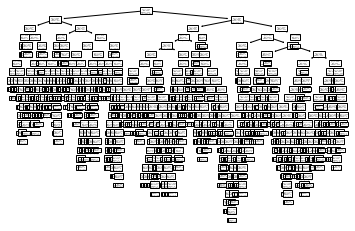

In [73]:
from sklearn import tree
tree.plot_tree(clf_dt)